 # Importing the required Modules

In [ ]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
from pathlib import Path
import seaborn as sns
import glob   # whether file path is specified or not
import random 
import os #to extact the image path
import cv2 #load the dataset
#tesor fow & keras
import tensorflow as tf #open source platform , a library
from tensorflow import keras
   
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from keras.models import load_model
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten, Dense,BatchNormalization,Dropout,Input 
from keras.models import Sequential, Model
from keras.layers import Conv2D,GlobalMaxPooling2D
from tensorflow.keras.applications import  Xception,VGG16,InceptionResNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#cnn
from tensorflow.keras import datasets, layers, models

from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from keras.engine.base_layer import Layer
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
image_path = '/content/drive/MyDrive/Fish_Dataset/Fish_Dataset'

In [ ]:
def get_Label(number):
    labels = {0:'Black Sea Sprat', 1:'Gilt-Head Bream',2:'Hourse Mackerel',
              3:'Red Mullet',4:'Red Sea Bream',5:'Sea Bass',6:'Shrimp',
              7:'Striped Red Mullet',8:'Trout'}
    return labels[number]

#plot prediction function
def plot_predection(model_name):
    plt.figure(figsize=(20,15))
    plt.suptitle("Prediction  Images", fontsize=20)
    count = 0  
    for i in range (35) :
        plt.subplot(5,7,i+1)
        img = plt.imread(df['image'].iloc[i])
        img = cv2.resize(img,(224,224))
        plt.imshow(img,cmap=plt.cm.binary)
        img = np.expand_dims(img, axis=0)
        feature = model_name.predict(img)
        predection  = np.argmax(feature, axis=1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.xlabel("A : "+df['label'].iloc[i],fontsize=12,color='red')
        plt.ylabel("P :"+get_Label(int(predection)),fontsize=12,color ='green')
        count += 1
        if count == 34 :
            break 


In [ ]:
# categorical ploting    
def categorical_plotting(df,col,title):
    fig, ax = plt.subplots(figsize=(10,7))
    ax=sns.countplot(x=col, data=df, palette='flare', order = df[col].value_counts().index)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    #ax.bar_label(ax.containers[0])
    plt.title(title)
    plt.show()

In [ ]:
def freezing_layers(model_name):
    for layer in model_name.layers:
      layer.trainable = False  

In [ ]:
train_path = Path(image_path)
#get all image that end with png
train_path.glob(r'**/*.png')
#convert it to list
filepath = list(train_path.glob(r'**/*.png'))
# split path  and image 
os.path.split(filepath[0])
# get image name 
os.path.split(os.path.split(filepath[0])[1])
# get labels
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],filepath))

In [ ]:
# get our df
df = pd.concat([pd.Series(filepath).astype(str), pd.Series(labels)], axis=1)
df.columns = ['image', 'label']
df.head(5)

,image,label
0,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Black Sea Sprat GT
1,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Black Sea Sprat GT
2,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Black Sea Sprat GT
3,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Black Sea Sprat GT
4,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Black Sea Sprat GT


In [ ]:
# shffle our df
df= df.sample(frac=1).reset_index(drop = True)
df

,image,label
0,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Gilt-Head Bream
1,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Striped Red Mullet GT
2,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Shrimp GT
3,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Red Mullet GT
4,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Trout GT
...,...,...
17995,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Gilt-Head Bream
17996,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Red Mullet GT
17997,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Striped Red Mullet
17998,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Striped Red Mullet GT


In [ ]:
#remove GT 
df = df[df['label'].apply(lambda x: x[-2:] != 'GT')]  
df.head(5)

,image,label
0,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Gilt-Head Bream
5,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Hourse Mackerel
8,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Shrimp
9,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Gilt-Head Bream
10,/content/drive/MyDrive/Fish_Dataset/Fish_Datas...,Gilt-Head Bream


In [ ]:
df.shape

(9000, 2)

In [ ]:
df['label'].value_counts()

Gilt-Head Bream       1000
Hourse Mackerel       1000
Shrimp                1000
Trout                 1000
Red Mullet            1000
Sea Bass              1000
Black Sea Sprat       1000
Red Sea Bream         1000
Striped Red Mullet    1000
Name: label, dtype: int64

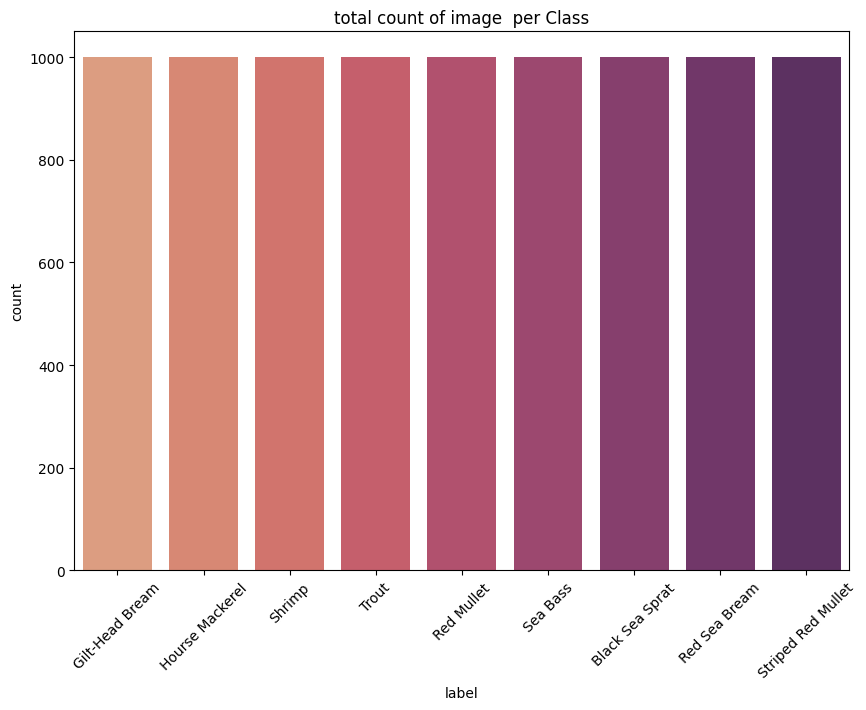

In [ ]:
categorical_plotting(df,'label','total count of image  per Class')

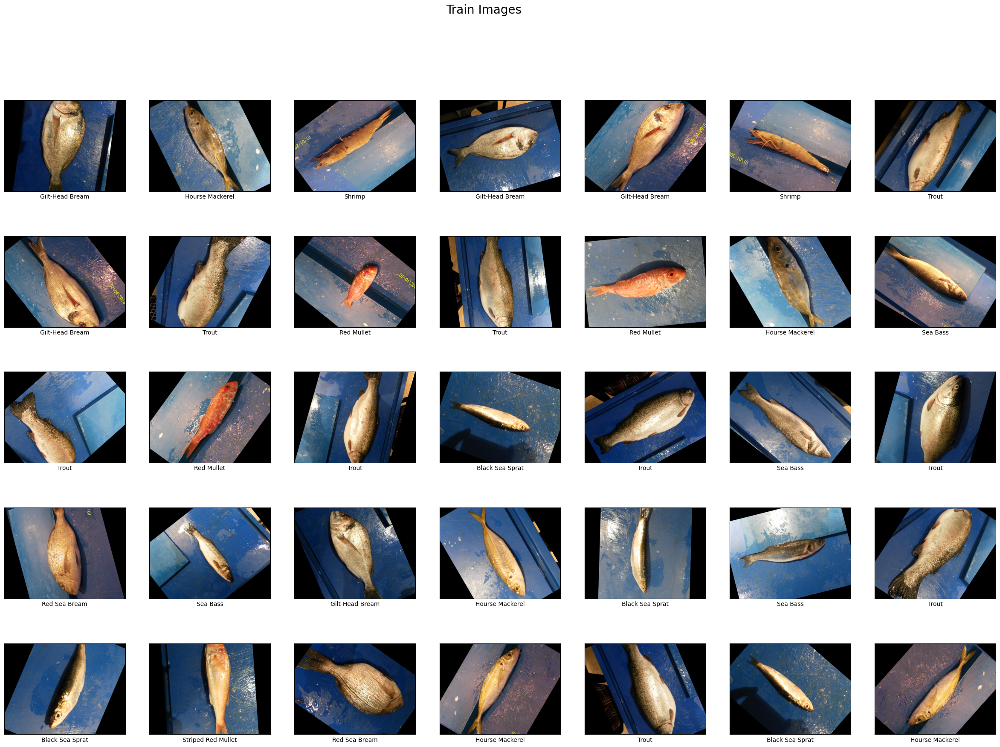

In [ ]:
plt.figure(figsize=(30,20))
plt.suptitle("Train Images", fontsize=20)
counter =0
for i in range(35)  :
        plt.subplot(5,7,i+1)
        full_image= plt.imread(df['image'].iloc[i])
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.xlabel(df['label'].iloc[i])
        plt.imshow(full_image, cmap=plt.cm.binary) 
        if i == 34:
            break

In [ ]:
x_train,x_test       = train_test_split(df ,random_state=42,shuffle=True,test_size=0.3)
x_train_new,x_val    = train_test_split(x_train ,random_state=42,shuffle=True,test_size=0.3)

In [ ]:
x_train['label'].value_counts()

Red Mullet            724
Gilt-Head Bream       711
Trout                 706
Striped Red Mullet    703
Red Sea Bream         701
Hourse Mackerel       692
Shrimp                689
Black Sea Sprat       688
Sea Bass              686
Name: label, dtype: int64

In [ ]:
x_test['label'].value_counts()

Sea Bass              314
Black Sea Sprat       312
Shrimp                311
Hourse Mackerel       308
Red Sea Bream         299
Striped Red Mullet    297
Trout                 294
Gilt-Head Bream       289
Red Mullet            276
Name: label, dtype: int64

In [ ]:
print('Train Images shape is        : ',x_train.shape)
print('test  Images  shape is       : ',x_test.shape)
print('Validation  Images  shape is : ',x_val.shape)

Train Images shape is        :  (6300, 2)
test  Images  shape is       :  (2700, 2)
Validation  Images  shape is :  (1890, 2)


In [ ]:

batch_size = 16
#create image generator for images 
image_gen = ImageDataGenerator(
                                  rescale = 1./255,
                                  shear_range = 0.2,
                                  zoom_range = 0.3,
                                  height_shift_range=0.2,
                                  width_shift_range=0.2,
                                  fill_mode='nearest',
                                   horizontal_flip=True,
                                   rotation_range = 20, 
                            
                               )
test_datagen = ImageDataGenerator(rescale = 1.0/255.)

In [ ]:

        
train = image_gen.flow_from_dataframe(
      x_train,
      x_col='image',
      y_col='label',
      target_size=(224,224),
      class_mode='categorical',
      shuffle=True, 
      color_mode='rgb',
      batch_size=batch_size
      )

test = test_datagen.flow_from_dataframe(
      x_test,
      x_col='image',
      y_col='label',
      target_size=(224,224),
      class_mode='categorical',
      shuffle=False, 
      color_mode='rgb',
      batch_size=batch_size
      )
validate = image_gen.flow_from_dataframe(
      x_val,
      x_col='image',
      y_col='label',
      target_size=(224,224),
      class_mode='categorical',
      shuffle=True, 
      color_mode='rgb',
      batch_size=batch_size
      )

Found 6300 validated image filenames belonging to 9 classes.
Found 2700 validated image filenames belonging to 9 classes.
Found 1890 validated image filenames belonging to 9 classes.


In [ ]:
validate

In [ ]:
#get our class label
train.class_indices

{'Black Sea Sprat': 0,
 'Gilt-Head Bream': 1,
 'Hourse Mackerel': 2,
 'Red Mullet': 3,
 'Red Sea Bream': 4,
 'Sea Bass': 5,
 'Shrimp': 6,
 'Striped Red Mullet': 7,
 'Trout': 8}

In [ ]:
for train_img , train_label in train :
    print('image shape ',train_img.shape)
    print('label  shape ',train_label.shape)
    break

image shape  (16, 224, 224, 3)
label  shape  (16, 9)


In [ ]:
for v_img , v_label in validate :
    print('image shape ',v_img.shape)
    print('label shape ',v_label.shape)
    break 

image shape  (16, 224, 224, 3)
label shape  (16, 9)


In [ ]:
def plotImges(imgarr,label):
  for idx,img in enumerate(imgarr):
    if idx<=10:
      plt.figure(figsize=(5,5))
      plt.imshow(img)
      plt.title(label[0])
      plt.axis=False
      plt.show()

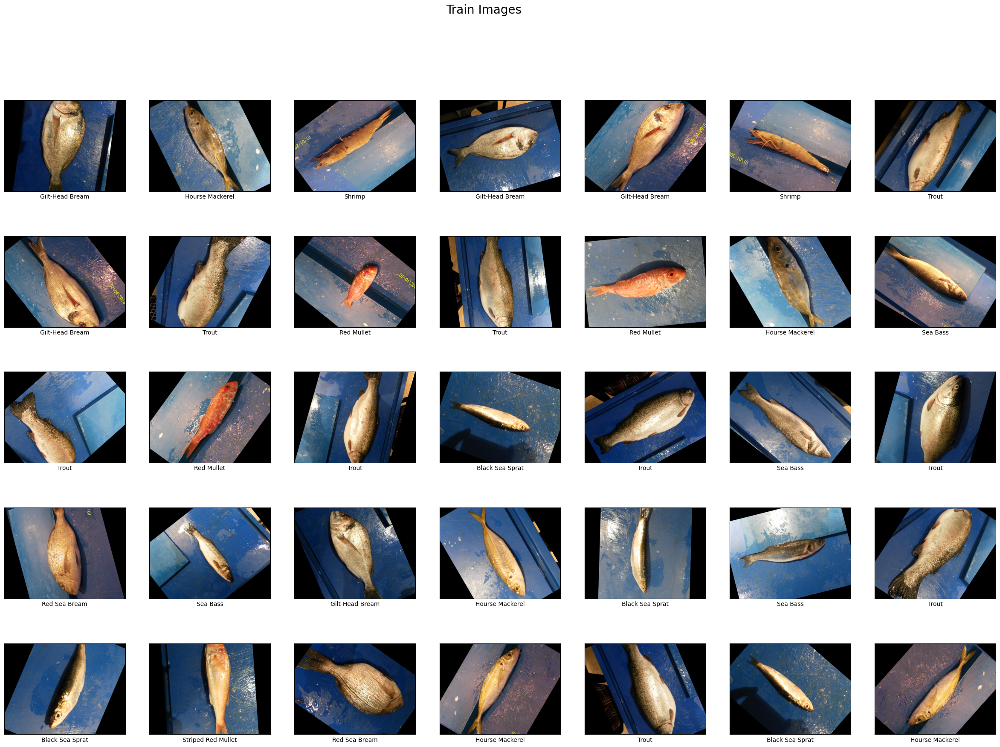

In [ ]:
plt.figure(figsize=(30,20))
plt.suptitle("Train Images", fontsize=20)
counter =0
for i in range(35)  :
        plt.subplot(5,7,i+1)
        full_image= plt.imread(df['image'].iloc[i])
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.xlabel(df['label'].iloc[i])
        plt.imshow(full_image, cmap=plt.cm.binary) 
        if i == 34:
            break

# Applying the model

# VGG16

In [ ]:
model = Sequential()
model.add(Conv2D(input_shape=(224,224,3),filters=64,kernel_size=(3,3),padding="same", activation="relu"))
model.add(Conv2D(filters=64,kernel_size=(3,3),padding="same", activation="relu"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))

In [ ]:
model.add(Flatten())
model.add(Dense(units=64,activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.3))
#model.add(Dense(units=4096,activation="relu"))
model.add(Dense(units=9, activation="softmax"))


In [ ]:
from keras.optimizers import Adam
opt = Adam(lr=0.001)
model.compile(optimizer=opt, loss=keras.losses.categorical_crossentropy, metrics=['accuracy'])

/usr/local/lib/python3.9/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 128)     147584    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 128)      0         
 2D)                                                    

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
checkpoint = ModelCheckpoint("vgg16_1.h5", monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
early = EarlyStopping(monitor='val_acc', min_delta=0, patience=20, verbose=1, mode='auto')
history = model.fit_generator(generator=train,
                       steps_per_epoch=train.n // train.batch_size,
                       validation_data=validate,
                       validation_steps=validate.n // validate.batch_size,
                       epochs=5,
                       verbose=1,
                       callbacks=[checkpoint,early]
                       )

<ipython-input-31-5ff4ab3a8eb4>:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(generator=train,


Epoch 1/5
393/393 [==============================] - ETA: 0s - loss: 1.9263 - accuracy: 0.2257

393/393 [==============================] - 3991s 10s/step - loss: 1.9263 - accuracy: 0.2257 - val_loss: 4.6269 - val_accuracy: 0.2590
Epoch 2/5
155/393 [==========>...................] - ETA: 1:39 - loss: 1.7089 - accuracy: 0.2863

In [ ]:

from keras.applications import vgg16

In [ ]:
base_model = vgg16.VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


In [ ]:

for layer in base_model.layers:
    layer.trainable = False
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
last_layer = base_model.get_layer('block5_pool')
last_output = last_layer.output

x = Flatten()(last_output)
x = Dense(64, activation='relu', name='FC_1')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
x = Dense(9, activation='softmax', name='softmax')(x)

new_model = Model(inputs=base_model.input, outputs=x)
new_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [ ]:
early_stopping = EarlyStopping(monitor='val_accuracy',
                               min_delta=0,
                               patience=2,
                               verbose=1,
                               mode='auto',                              
                               restore_best_weights=True)
checkpoint = ModelCheckpoint("vgg16_1.h5", monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)

In [ ]:
from keras.optimizers import Adam
new_model.compile(Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

/usr/local/lib/python3.9/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
new_model.compile(Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
history = new_model.fit_generator(generator=train,
                       steps_per_epoch=train.n // train.batch_size,
                       validation_data=validate,
                       validation_steps=validate.n // validate.batch_size,
                       epochs=5,
                       verbose=1,
                       callbacks=[checkpoint,early_stopping]
                       )

<ipython-input-46-7130b510951c>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = new_model.fit_generator(generator=train,


Epoch 1/5
393/393 [==============================] - ETA: 0s - loss: 1.1712 - accuracy: 0.6071 

In [ ]:
new_model.save("model1.h5")

In [ ]:
new_model.save("/content/drive/MyDrive/Fish_Dataset/Fish_Dataset/model1.h5")

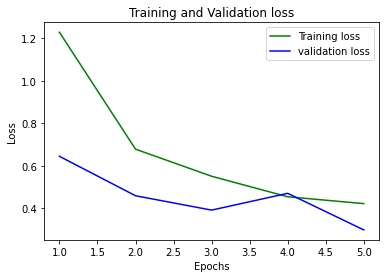

In [ ]:

loss_train = history.history['loss']
loss_val = history.history['val_loss']
epochs = range(1,6)
plt.plot(epochs, loss_train, 'g', label='Training loss')
plt.plot(epochs, loss_val, 'b', label='validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

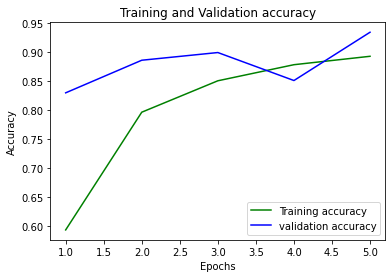

In [ ]:
loss_train1 = history.history['accuracy']
loss_val1 = history.history['val_accuracy']
epochs = range(1,6)
plt.plot(epochs, loss_train1, 'g', label='Training accuracy')
plt.plot(epochs, loss_val1, 'b', label='validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

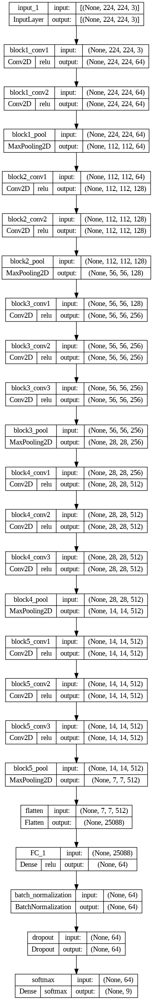

In [ ]:
tf.keras.utils.plot_model(
new_model,
to_file="model.png",
show_shapes=True,
show_dtype=False,
show_layer_names=True,
rankdir="TB",
expand_nested=True,
dpi=96,
layer_range=None,
show_layer_activations=True,
)

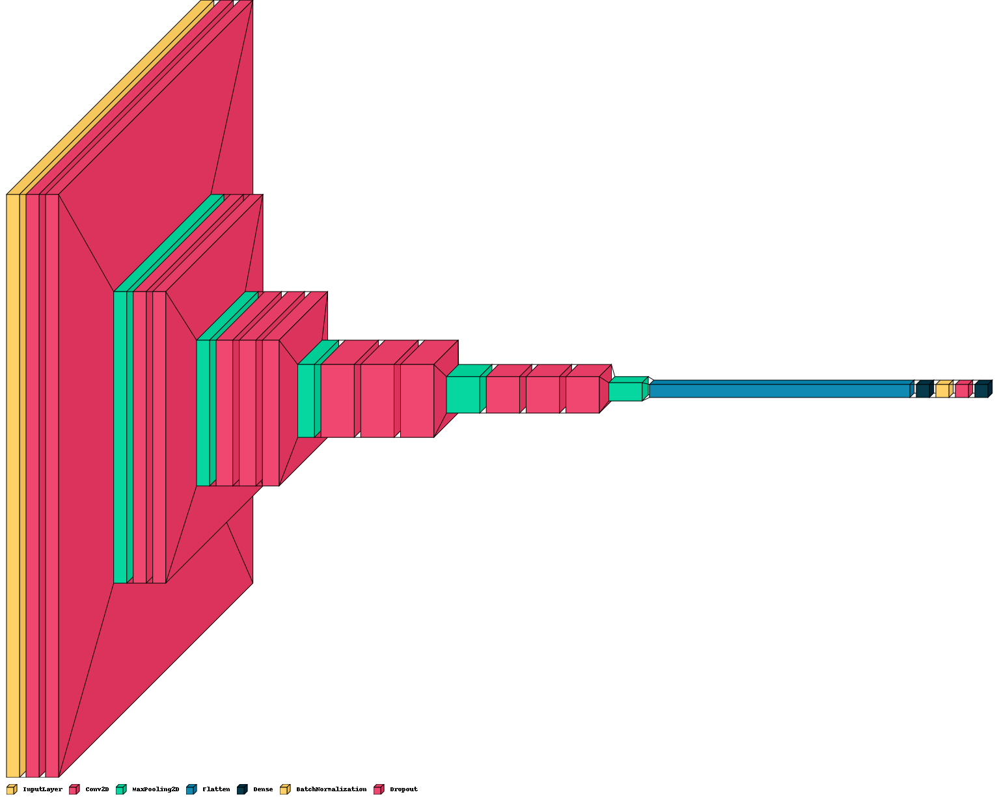

In [ ]:

import visualkeras
from PIL import ImageFont
visualkeras.layered_view(new_model, legend=True)

In [ ]:
# Resnet50

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing import image

In [ ]:
tf.keras.applications.resnet50.ResNet50(include_top=False,input_tensor=None,input_shape=(224,224,3), pooling=None, classes=1000)

In [ ]:
model = ResNet50()

102967424/102967424 [==============================] - 3s 0us/step


In [ ]:
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [ ]:
last_layer = model.get_layer('conv2_block3_out')
last_output = last_layer.output

In [ ]:
x = Flatten()(last_output)
x = Dense(64, activation='relu', name='FC_1')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
x = Dense(9, activation='softmax', name='softmax')(x)

model = Model(inputs=model.input, outputs=x)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
early_stopping = EarlyStopping(monitor='val_accuracy',
                               min_delta=0,
                               patience=3,
                               verbose=1,
                               mode='auto',
                               restore_best_weights=True)
checkpoint = ModelCheckpoint("resnet.h5", monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)

In [ ]:
model.compile (
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [ ]:
history= model.fit_generator(generator=train,
                       steps_per_epoch=train.n // train.batch_size,
                       validation_data=validate,
                       validation_steps=validate.n // validate.batch_size,
                       epochs=5,
                       verbose=1,
                       callbacks=[early_stopping,checkpoint])

<ipython-input-59-eb275e5147d4>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history= model.fit_generator(generator=train,


Epoch 1/5
393/393 [==============================] - ETA: 0s - loss: 1.1060 - accuracy: 0.6303

393/393 [==============================] - 241s 588ms/step - loss: 1.1060 - accuracy: 0.6303 - val_loss: 6.5370 - val_accuracy: 0.1086
Epoch 2/5
393/393 [==============================] - ETA: 0s - loss: 0.4271 - accuracy: 0.8791

393/393 [==============================] - 199s 506ms/step - loss: 0.4271 - accuracy: 0.8791 - val_loss: 5.4377 - val_accuracy: 0.1255
Epoch 3/5
393/393 [==============================] - ETA: 0s - loss: 0.2787 - accuracy: 0.9190

393/393 [==============================] - 234s 596ms/step - loss: 0.2787 - accuracy: 0.9190 - val_loss: 1.3810 - val_accuracy: 0.5360
Epoch 4/5
393/393 [==============================] - ETA: 0s - loss: 0.1832 - accuracy: 0.9475

393/393 [==============================] - 219s 557ms/step - loss: 0.1832 - accuracy: 0.9475 - val_loss: 1.6626 - val_accuracy: 0.6197
Epoch 5/5
393/393 [==============================] - ETA: 0s - loss: 0.1633 - accuracy: 0.9515

393/393 [==============================] - 190s 485ms/step - loss: 0.1633 - accuracy: 0.9515 - val_loss: 1.6384 - val_accuracy: 0.5254


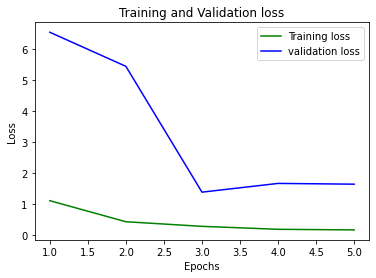

In [ ]:
loss_train = history.history['loss']
loss_val = history.history['val_loss']
epochs = range(1,6)
plt.plot(epochs, loss_train, 'g', label='Training loss')
plt.plot(epochs, loss_val, 'b', label='validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

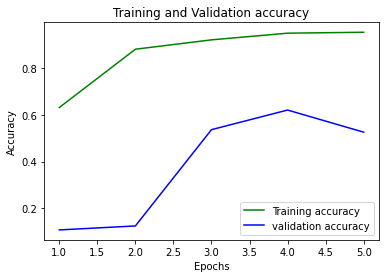

In [ ]:
loss_train2= history.history['accuracy']
loss_val2 = history.history['val_accuracy']
epochs = range(1,6)
plt.plot(epochs, loss_train2, 'g', label='Training accuracy')
plt.plot(epochs, loss_val2, 'b', label='validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

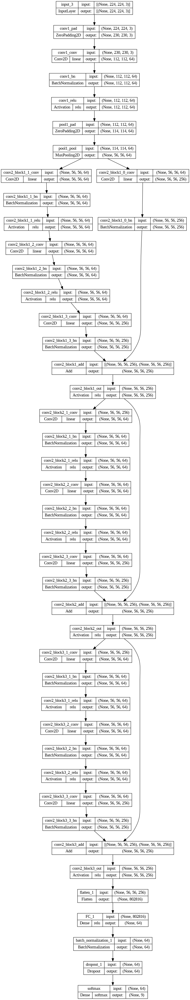

In [ ]:
tf.keras.utils.plot_model(
model,
to_file="model.png",
show_shapes=True,
show_dtype=False,
show_layer_names=True,
rankdir="TB",
expand_nested=True,
dpi=96,
layer_range=None,
show_layer_activations=True,
)

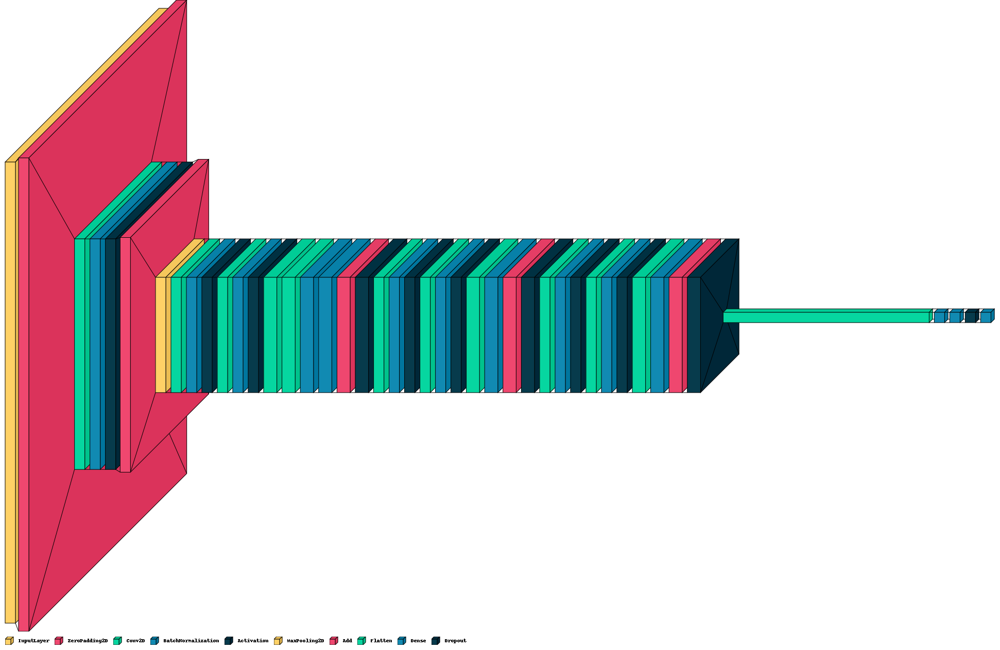

In [ ]:

import visualkeras
from PIL import ImageFont
visualkeras.layered_view(model, legend=True)

In [ ]:
new_model.save("model2.h5")

In [ ]:
new_model.save('/content/drive/MyDrive/Fish_Dataset/Fish_Dataset/model2.h5')

# Comparing 2 models

In [ ]:
results=pd.DataFrame({'Model':['VGG16','Resnet50'],
                     'Accuracy Score':[max(loss_train1),max(loss_train2)]})
result_df=results.sort_values(by='Accuracy Score', ascending=False)
result_df=result_df.set_index('Model')
(result_df)

,Accuracy Score
Model,
Resnet50,0.951464
VGG16,0.892903


# Loading the model

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
model = load_model("/content/drive/MyDrive/Fish_Dataset/Fish_Dataset/model2.h5")

In [ ]:
model.evaluate(test)

169/169 [==============================] - 222s 1s/step - loss: 0.1401 - accuracy: 0.9756


[0.14008867740631104, 0.9755555391311646]

In [ ]:
def predictor(test_gen):    
    y_pred= []
    error_list=[]
    error_pred_list = []
    y_true=test.labels
    classes=list(test.class_indices.keys())
    class_count=len(classes)
    errors=0
    preds=model.predict(test, verbose=1)
    tests=len(preds)    
    for i, p in enumerate(preds):        
        pred_index=np.argmax(p)         
        true_index=test.labels[i]          
        if pred_index != true_index:                                            
            errors=errors + 1
            file=test.filenames[i]
            error_list.append(file)
            error_class=classes[pred_index]
            error_pred_list.append(error_class)
        y_pred.append(pred_index)
   
    ypred=np.array(y_pred)
    ytrue=np.array(y_true)
    f1score=f1_score(ytrue, ypred, average='weighted')
    if class_count <=3000:
        cm = confusion_matrix(ytrue, ypred )
        plt.figure(figsize=(12, 8))
        sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)       
        plt.xticks(np.arange(class_count)+.5, classes, rotation=90)
        plt.yticks(np.arange(class_count)+.5, classes, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix")
        plt.show()
    clr = classification_report(y_true, y_pred, target_names=classes, digits= 4) # create classification report
    print("Classification Report:\n----------------------\n", clr)

    return errors, tests, error_list, error_pred_list, f1score

169/169 [==============================] - 35s 207ms/step


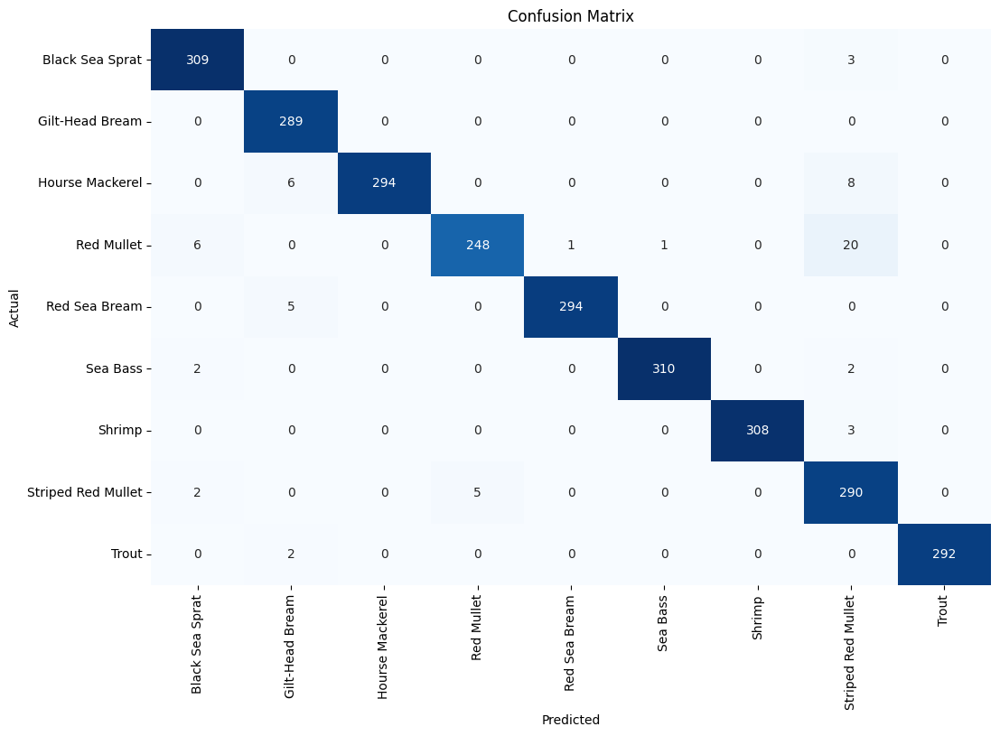

Classification Report:
----------------------
                     precision    recall  f1-score   support

   Black Sea Sprat     0.9687    0.9904    0.9794       312
   Gilt-Head Bream     0.9570    1.0000    0.9780       289
   Hourse Mackerel     1.0000    0.9545    0.9767       308
        Red Mullet     0.9802    0.8986    0.9376       276
     Red Sea Bream     0.9966    0.9833    0.9899       299
          Sea Bass     0.9968    0.9873    0.9920       314
            Shrimp     1.0000    0.9904    0.9952       311
Striped Red Mullet     0.8896    0.9764    0.9310       297
             Trout     1.0000    0.9932    0.9966       294

          accuracy                         0.9756      2700
         macro avg     0.9765    0.9749    0.9752      2700
      weighted avg     0.9769    0.9756    0.9757      2700

0.9756640079835419


In [ ]:
errors, tests, error_list, error_pred_list, f1score = predictor(validate)
print(f1score)

#Image Classification

In [ ]:
img='/content/drive/MyDrive/Fish_Dataset/Fish_Dataset/Trout/Trout/00011.png'


In [ ]:
import numpy as np
from tensorflow.keras.utils import img_to_array
from keras.models import load_model
from tensorflow.keras.utils import load_img
#img = load_img(img, target_size=(224,224))
x = img_to_array(img)
x=x/255
#img = convolver_rgb(img, sharpen, iterations = 1)
x=x.reshape(224,224,3)
x = np.expand_dims(x, axis=0)

predi=model.predict(x)
print(predi)
classes_x=np.argmax(predi)    
print(classes_x)

classes=["Black Sea Sprat", "Gilt-Head Bream","Hourse Mackerel","Red Mullet","Red Sea Bream ","Sea Bass ","Shrimp","Striped Red Mullet","Trout"]  
prediction_label=classes[classes_x]
print("Fishes classified as : "+prediction_label)

1/1 [==============================] - 9s 9s/step
[[5.5819870e-05 1.1033589e-02 1.0738844e-03 8.2741455e-05 2.9753053e-05
  9.9157980e-03 1.8510087e-05 4.7781086e-04 9.7731209e-01]]
8
Fishes classified as : Trout
